The second task we had was to demonstrates a versatile pipeline for processing and enriching information related to chemical ingredients, product barcodes, and image-based text extraction using Optical Character Recognition (OCR). Below is a concise report summarizing the key functionalities:

OCR and Text Processing:
•	The script uses Tesseract OCR to extract text from an image (IMG_6970.jpg). It processes the image, applies thresholding, and extracts relevant information using pytesseract.

Chemical Ingredients Processing:
•	The code initially loads a dataset (kungul_ingridients_new.xlsx) containing chemical ingredient information. It performs data cleaning operations, checks for duplicates, and ensures the dataset is well-structured.

In [ ]:
!pip install pytesseract
!apt install tesseract-ocr
!pip install Pillow
!apt install libtesseract-dev
import pandas as pd
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity
!pip install scikit-learn
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
import nltk

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 24 not upgraded.
Need to get 4,816 kB of archives.
After this operation, 15.6 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-eng all 1:4.00~git30-7274cfa-1.1 [1,591 kB]
Get:2 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr-osd all 1:4.00~git30-7274cfa-1.1 [2,990 kB]
Get:3 http://archive.ubuntu.com/ubuntu jammy/universe amd64 tesseract-ocr amd64 4.1.1-2.1build1 [236 kB]
Fetched 4,816 kB in 2s (2,635 kB/s)
Selecting previously unselected package tesseract-ocr-eng.
(Reading database ... 121658 files and directories currently installed.)
Preparing to unpack .../tesseract-ocr-

In [ ]:
!sudo apt-get install libzbar0
!sudo apt-get install libzbar-dev

Reading package lists... Done
Building dependency tree... Done
Reading state information... Done
The following additional packages will be installed:
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript gsfonts
  imagemagick-6-common libdjvulibre-text libdjvulibre21 libfftw3-double3
  libgs9 libgs9-common libidn12 libijs-0.35 libjbig2dec0 libjxr-tools libjxr0
  liblqr-1-0 libmagickcore-6.q16-6 libmagickcore-6.q16-6-extra
  libmagickwand-6.q16-6 libv4l-0 libv4lconvert0 libwmflite-0.2-7 poppler-data
Suggested packages:
  fonts-noto fonts-freefont-otf | fonts-freefont-ttf fonts-texgyre
  ghostscript-x libfftw3-bin libfftw3-dev inkscape poppler-utils
  fonts-japanese-mincho | fonts-ipafont-mincho fonts-japanese-gothic
  | fonts-ipafont-gothic fonts-arphic-ukai fonts-arphic-uming fonts-nanum
The following NEW packages will be installed:
  fonts-droid-fallback fonts-noto-mono fonts-urw-base35 ghostscript gsfonts
  imagemagick-6-common libdjvulibre-text libdjvulibre21 libfftw3-

Barcode Image Processing:
•	Utilizing external libraries such as pytesseract and pyzbar, the code reads text information from images, particularly focusing on barcode images. It applies image preprocessing techniques, including thresholding, to enhance OCR accuracy.

Barcode Image Processing:
•	Barcode information is read from the same image (IMG_6970.jpg). The script uses the pyzbar library to decode barcode data.


In [ ]:
!pip install python-barcode
!pip install pyzbar Pillow

import barcode
from barcode import EAN13
from barcode.writer import ImageWriter
import sys  # Import sys module for sys.exit()
from pyzbar.pyzbar import decode
from PIL import Image

# Set the path to the Tesseract executable (update with your installation path)
# pytesseract.pytesseract.tesseract_cmd = '/C:\slobo\OneDrive\Documents/bin/tesseract'

from PIL import Image
from IPython.display import display
from PIL import Image, ImageEnhance, ImageFilter
import pytesseract
from sklearn.feature_extraction.text import CountVectorizer
from sklearn.metrics.pairwise import cosine_similarity

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 213.0/213.0 kB 4.4 MB/s eta 0:00:00


In [ ]:
!tesseract --version

tesseract 4.1.1
 leptonica-1.82.0
  libgif 5.1.9 : libjpeg 8d (libjpeg-turbo 2.1.1) : libpng 1.6.37 : libtiff 4.3.0 : zlib 1.2.11 : libwebp 1.2.2 : libopenjp2 2.4.0
 Found AVX512BW
 Found AVX512F
 Found AVX2
 Found AVX
 Found FMA
 Found SSE
 Found libarchive 3.6.0 zlib/1.2.11 liblzma/5.2.5 bz2lib/1.0.8 liblz4/1.9.3 libzstd/1.4.8


In [ ]:
df = pd.read_excel('/content/product_barcode_list.xlsx')

In [ ]:
df.head()

,Barcode,Unnamed: 1,Ingredient List,Name
0,3600542399326,3600542399326,"Aqua / Water, Aluminum Chlorohydrate, Cetearyl...",Garnier Mineral Hyaluronic Care 72H Deodorant ...
1,8606029266766,8606029266766,Silicone,Velnea Fingering Silik.Lila
2,4049639429550,4049639429550,"aqua (water),stearic acid,copernicia cerifera ...","Magic Finish 5-In-1 Hybrid Mascara\nVolume, Le..."
3,4011700740291,4011700740291,"butane,alcohol,propane,parfum (fragrance),dipr...",Echt Kï¿½Lnisch Wasser Aerosol Deodorant Spray...
4,4011700740475,4011700740475,"sodium palmate,sodium palm kernelate,aqua (wat...",Echt Kï¿½Lnisch Wasser Cream Soap\nMildly Clea...


Barcode Input Handling:
•	From the barcode we can input a list of ingredients either through OCR results or manual entry. The input is processed, removing unnecessary whitespaces and ensuring validity.

Word Embeddings and Similarity Matching:
•	The script utilizes Word2Vec embeddings to represent chemical phrases. It calculates cosine similarities between the user's input and the phrases stored in a DataFrame (df_TIM1_FINAL.csv). Matches are identified based on similarity scores.


In [ ]:
program_df = pd.read_csv('/content/df_TIM1_FINAL.csv')

In [ ]:
# Clean the 'Name' column by removing or imputing missing values
program_df['Name'] = program_df['Name'].fillna("")  # Replace NaN with an empty string

In [ ]:
# Function to read numbers from a barcode image
def read_barcode(filename):
    image = Image.open(filename)
    decoded_objects = decode(image)

    # Assuming there is only one barcode in the image
    if decoded_objects:
        return decoded_objects[0].data.decode('utf-8')
    else:
        return None

Word Embeddings with Word2Vec:
•	The script leverages Word2Vec embeddings to capture semantic relationships between chemical phrases. It tokenizes phrases, trains a Word2Vec model, and computes vectors for each phrase, enabling similarity calculations

In [ ]:
from gensim.models import Word2Vec
from nltk.tokenize import word_tokenize
import nltk
import numpy as np

nltk.download('punkt')

# Assuming program_df is your DataFrame with a 'Name' column containing chemical phrases(names)
corpus = program_df['Name'].tolist()

# Tokenize the phrases into individual words
tokenized_corpus = [word_tokenize(phrase.lower()) for phrase in corpus]

# Define and train Word2Vec model
model = Word2Vec(sentences=tokenized_corpus, vector_size=50, window=5, sg=1, min_count=1)

# Access word vectors
word_vectors = model.wv
#for word, vector in zip(word_vectors.index_to_key, word_vectors.vectors):
    #print(f"{word}: {vector}")

def get_sentence_vector(sentence): # sentence meance phrase or chemical name
    words = word_tokenize(sentence.lower())
    word_vectors = [model.wv[word] for word in words if word in model.wv]
    if word_vectors:
        return np.mean(word_vectors, axis=0)
    else:
        return np.zeros(model.vector_size)

[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Unzipping tokenizers/punkt.zip.


Ingredient Matching and Attribute Display:
•	The script matches user-inputted ingredients and barcode-derived ingredients against the DataFrame. Information about potential matches, including attributes such as 'Carcinogens', 'EndocrineDisruptors', 'Allergen', and 'SkinIrritant', is displayed.

User Interaction and Output:
•	The user is informed about the matched ingredients and associated attributes. The script provides clear output, enhancing user understanding of chemical compositions and potential product matches.

Barcode Number Input:
•	If the barcode is not detected in the image, the user is prompted to manually input the barcode number. The script then retrieves ingredient information associated with the provided barcode.

Error Handling:
•	The script incorporates error handling to manage situations where OCR results are empty or invalid inputs are provided. This ensures a smooth and reliable user experience.

Display of Results:
•	The script displays detailed information about matched ingredients, facilitating a quick overview of chemical attributes and potential matches.


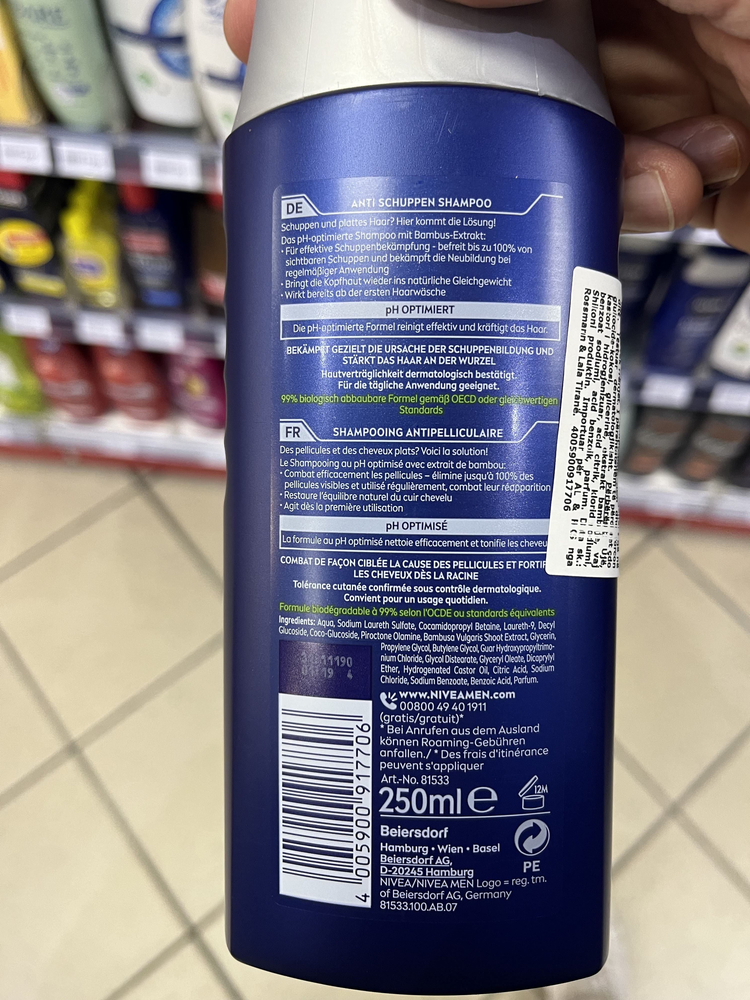

No matching ingredients found related to the image.
Barcode Number: 4005900917706
For the product's barcode, according to our knowledge, we are providing the following information:
 
                              Ingredients  Carcinogens  EndocrineDisruptors  \
0                                    Aqua        False                False   
1                  Sodium Laureth Sulfate        False                False   
2                  Cocamidopropyl Betaine        False                False   
3                               Laureth-9        False                False   
4                         Decyl Glucoside        False                False   
5                          Coco-Glucoside        False                False   
6                       Piroctone Olamine        False                False   
7          Bambusa Vulgaris Shoot Extract        False                False   
8                                Glycerin        False                False   
9                        Pr

In [ ]:
path = '/content/IMG_6970.jpg'
path_barcode = '/content/IMG_6970.jpg'

# Load an image using PIL
image_path = path
image = Image.open(image_path)
display(image)

# Open an image file
image_path = path
image = Image.open(image_path)

# Get pixel data
pix = image.load()

# Threshold values for RGB components
threshold = 102

# Binarize the image
for y in range(image.size[1]):
    for x in range(image.size[0]):
        if pix[x, y][0] < threshold or pix[x, y][1] < threshold or pix[x, y][2] < threshold:
            pix[x, y] = (0, 0, 0, 255)  # Set to black
        else:
            pix[x, y] = (255, 255, 255, 255)  # Set to white




# Save the processed image (optional)
processed_image_path = '/content/processed_image.jpg'
image.save(processed_image_path)

ocr_result = pytesseract.image_to_string(Image.open(processed_image_path))
#print("OCR Result:", ocr_result)




while True:
    # Use OCR result as input
    user_input = ocr_result

    # Remove leading and trailing whitespaces
    user_input = user_input.strip()

    # Check if the input is empty
    if not user_input:
        print("No text extracted from OCR. Please try again with barcode image.")
        # Add appropriate handling or exit the script if necessary
        sys.exit()





    # Split the input into a list
    user_input_list = user_input.split(',')

    # Remove leading and trailing whitespaces from each ingredient
    user_input_list = [ingredient.strip() for ingredient in user_input_list]

    # Remove empty strings from the list
    user_input_list = list(filter(None, user_input_list))

    # Check if there are valid ingredients
    if not user_input_list:
        print("Please enter valid ingredients.")
        continue

    break  # Exit the loop if the input is valid






# Convert the user input list to a single string for comparison
user_input_str = ' '.join(user_input_list)

# Get the vector representation of the user input
user_input_vector = get_sentence_vector(user_input_str)

# Get vectors for all phrases in the DataFrame
phrase_vectors = [get_sentence_vector(phrase) for phrase in program_df['Name']]

# Calculate cosine similarities
cosine_similarities = cosine_similarity([user_input_vector] + phrase_vectors)

# Find matches and sort in descending order
similar_recipes_indices = np.argsort(cosine_similarities[0])[::-1]
similar_recipes = cosine_similarities[0][similar_recipes_indices][1:]

# Find matches above the similarity threshold
matching_indices = [index for index in similar_recipes_indices if similar_recipes[index - 1] > 1]





# Create a DataFrame with the matching ingredients and include the user's input
if matching_indices:
    matched_df = program_df.iloc[matching_indices][['Name', 'Carcinogens', 'EndocrineDisruptors', 'Allergen', 'SkinIrritant']]
    # matched_df['User_Input'] = user_input_str
    print("For the image you inputted, we are providing the following information:")
    print(' ')
    print(matched_df.head(20))
else:
    print("No matching ingredients found related to the image.")


    # Example: Read numbers from the provided barcode image
    barcode_filename = path_barcode
    read_number = read_barcode(barcode_filename)


    if read_number is not None:
        print(f"Barcode Number: {read_number}")
        user_input = int(read_number) # ova posle odi kako input za dobivanje info od barkod
    elif read_number is None:
        print("No barcode found in the image.")
        user_input = input("Enter barcode: ").strip().lower()
        pass




        # if user_input.strip():
        #     # Check if the user entered a non-empty string
        #     read_number = user_input


    # Function to get ingredient list by barcode as DATAFRAME
    def get_ingredient_list_df(barcode):
        result = df[df['Barcode'] == barcode]['Ingredient List']
        if not result.empty:
            ingredients = result.values[0].split(',')
            # Create a DataFrame with a single row and a column named 'Ingredients'
            df_ingredients = pd.DataFrame({'Ingredients': ingredients})


            # ingredients = result.values[0].split(', ')
            # df_ingredients = pd.DataFrame({'Ingredient': ingredients})
            return df_ingredients
        else:
            print('Barcode number not found in the database.')
            #sys.exit()




    # Call the function and display the result
    ingredient_df = get_ingredient_list_df(int(user_input))

    if not ingredient_df.empty:

      ingredient = ingredient_df['Ingredients'].tolist()
      print("For the product's barcode, according to our knowledge, we are providing the following information:")
    #print(ingredient_df)

    # ingredient = ingredient_df['Ingredients'].tolist()

    def get_sentence_vector_list_2(sentences):
      vectors = [get_sentence_vector(sentence) for sentence in sentences]
      return vectors


      # Get the vector representation of the user input list
    user_input_vectors = get_sentence_vector_list_2(ingredient)


        # Get vectors for all phrases in the DataFrame
    phrase_vectors = [get_sentence_vector(phrase) for phrase in program_df['Name']]

        # Calculate cosine similarities
    cosine_similarities = cosine_similarity([user_input_vector] + phrase_vectors)


    # Find matches and sort in descending order
    similar_recipes_indices = np.argsort(cosine_similarities[0])[::-1]
    similar_recipes = cosine_similarities[0][similar_recipes_indices][1:]
    matching_barcode_indices = [index for index, sim in enumerate(similar_recipes) if sim > 0.80]




    if matching_barcode_indices:
        matched_df = program_df.iloc[matching_barcode_indices][['Carcinogens', 'EndocrineDisruptors', 'Allergen', 'SkinIrritant']]
        result_df = pd.concat([ingredient_df, matched_df], axis = 1)
      # matched_df['User_Input'] = user_input_str
          #print("For the image you inputted, we are providing the following information:")
        print(' ')
        print(result_df.head(len(ingredient))) # vrati dataframe kolku so ima ingredients od lista od produkt tabela, so info od matching ingridients
    else:
        print("No matching ingredients found related to the image.")


In summary, the code for the second task seamlessly integrates OCR, word embeddings, and similarity matching to enrich chemical ingredient information. It caters to user inputs from both text and barcode images, offering valuable insights into the characteristics of various chemical components. The robust pipeline enhances data-driven decision-making and exploration within the domain of chemical analysis and product information retrieval.